# Fetching Coverage-data

In [177]:
import pandas as pd


SyntaxError: invalid syntax (263908895.py, line 2)

In [117]:
data1 = pd.read_excel("C:/Users/dell/Downloads/coverage-data.xlsx")

In [118]:
data1.head()

,GROUP,CODE,NAME,YEAR,ANTIGEN,ANTIGEN_DESCRIPTION,COVERAGE_CATEGORY,COVERAGE_CATEGORY_DESCRIPTION,TARGET_NUMBER,DOSES,COVERAGE
0,COUNTRIES,ABW,Aruba,2023.0,BCG,BCG,ADMIN,Administrative coverage,NaN,NaN,NaN
1,COUNTRIES,ABW,Aruba,2023.0,BCG,BCG,OFFICIAL,Official coverage,NaN,NaN,NaN
2,COUNTRIES,ABW,Aruba,2023.0,DIPHCV4,"Diphtheria-containing vaccine, 4th dose (1st b...",ADMIN,Administrative coverage,1044.0,945.0,90.52
3,COUNTRIES,ABW,Aruba,2023.0,DIPHCV4,"Diphtheria-containing vaccine, 4th dose (1st b...",OFFICIAL,Official coverage,NaN,NaN,90.52
4,COUNTRIES,ABW,Aruba,2023.0,DIPHCV5,"Diphtheria-containing vaccine, 5th dose (2nd b...",ADMIN,Administrative coverage,1219.0,1008.0,82.69


In [119]:
data1.shape

(399859, 11)

In [120]:
data1.tail()

,GROUP,CODE,NAME,YEAR,ANTIGEN,ANTIGEN_DESCRIPTION,COVERAGE_CATEGORY,COVERAGE_CATEGORY_DESCRIPTION,TARGET_NUMBER,DOSES,COVERAGE
399854,WHO_REGIONS,WPR,Western Pacific Region,1980.0,MCV1,"Measles-containing vaccine, 1st dose",WUENIC,WHO/UNICEF Estimates of National Immunization ...,27939588.0,1209026.0,4.0
399855,WHO_REGIONS,WPR,Western Pacific Region,1980.0,PAB,Protection at birth (PAB) against neonatal tet...,PAB,PAB Estimates,4494513.0,276306.0,6.0
399856,WHO_REGIONS,WPR,Western Pacific Region,1980.0,POL3,"Polio, 3rd dose",WUENIC,WHO/UNICEF Estimates of National Immunization ...,27939588.0,1296611.0,5.0
399857,WHO_REGIONS,WPR,Western Pacific Region,1980.0,RCV1,"Rubella-containing vaccine, 1st dose",WUENIC,WHO/UNICEF Estimates of National Immunization ...,27939588.0,40245.0,0.0
399858,Created: 2025-02-01 16:00 UTC,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [121]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 399859 entries, 0 to 399858
Data columns (total 11 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   GROUP                          399859 non-null  object 
 1   CODE                           399858 non-null  object 
 2   NAME                           398584 non-null  object 
 3   YEAR                           399858 non-null  float64
 4   ANTIGEN                        399858 non-null  object 
 5   ANTIGEN_DESCRIPTION            399858 non-null  object 
 6   COVERAGE_CATEGORY              399858 non-null  object 
 7   COVERAGE_CATEGORY_DESCRIPTION  399858 non-null  object 
 8   TARGET_NUMBER                  79030 non-null   float64
 9   DOSES                          79327 non-null   float64
 10  COVERAGE                       230477 non-null  float64
dtypes: float64(4), object(7)
memory usage: 33.6+ MB


In [122]:
data1 = data1.drop(index=399858)

In [123]:
# Fill missing values
data1['TARGET_NUMBER'] = data1.groupby(['ANTIGEN'])['TARGET_NUMBER'].transform(lambda x: x.fillna(x.median()))
data1['DOSES'] = data1.groupby(['ANTIGEN'])['DOSES'].transform(lambda x: x.fillna(x.median()))
data1['COVERAGE'] = data1.groupby(['ANTIGEN'])['COVERAGE'].transform(lambda x: x.fillna(x.median()))
data1.update(data1['NAME'].fillna("NS"))

In [124]:
data1.isnull().sum()

GROUP                            0
CODE                             0
NAME                             0
YEAR                             0
ANTIGEN                          0
ANTIGEN_DESCRIPTION              0
COVERAGE_CATEGORY                0
COVERAGE_CATEGORY_DESCRIPTION    0
TARGET_NUMBER                    0
DOSES                            0
COVERAGE                         0
dtype: int64

In [125]:
data1.dtypes

GROUP                             object
CODE                              object
NAME                              object
YEAR                             float64
ANTIGEN                           object
ANTIGEN_DESCRIPTION               object
COVERAGE_CATEGORY                 object
COVERAGE_CATEGORY_DESCRIPTION     object
TARGET_NUMBER                    float64
DOSES                            float64
COVERAGE                         float64
dtype: object

In [126]:
data1['YEAR'] = data1['YEAR'].astype(int)
data1['TARGET_NUMBER'] = data1['TARGET_NUMBER'].astype(int)
data1['DOSES'] = data1['DOSES'].astype(int)

In [127]:
data1

,GROUP,CODE,NAME,YEAR,ANTIGEN,ANTIGEN_DESCRIPTION,COVERAGE_CATEGORY,COVERAGE_CATEGORY_DESCRIPTION,TARGET_NUMBER,DOSES,COVERAGE
0,COUNTRIES,ABW,Aruba,2023,BCG,BCG,ADMIN,Administrative coverage,429586,376769,92.00
1,COUNTRIES,ABW,Aruba,2023,BCG,BCG,OFFICIAL,Official coverage,429586,376769,92.00
2,COUNTRIES,ABW,Aruba,2023,DIPHCV4,"Diphtheria-containing vaccine, 4th dose (1st b...",ADMIN,Administrative coverage,1044,945,90.52
3,COUNTRIES,ABW,Aruba,2023,DIPHCV4,"Diphtheria-containing vaccine, 4th dose (1st b...",OFFICIAL,Official coverage,65501,56755,90.52
4,COUNTRIES,ABW,Aruba,2023,DIPHCV5,"Diphtheria-containing vaccine, 5th dose (2nd b...",ADMIN,Administrative coverage,1219,1008,82.69
...,...,...,...,...,...,...,...,...,...,...,...
399853,WHO_REGIONS,WPR,Western Pacific Region,1980,DTPCV3,"DTP-containing vaccine, 3rd dose",WUENIC,WHO/UNICEF Estimates of National Immunization ...,27939588,2273390,8.00
399854,WHO_REGIONS,WPR,Western Pacific Region,1980,MCV1,"Measles-containing vaccine, 1st dose",WUENIC,WHO/UNICEF Estimates of National Immunization ...,27939588,1209026,4.00
399855,WHO_REGIONS,WPR,Western Pacific Region,1980,PAB,Protection at birth (PAB) against neonatal tet...,PAB,PAB Estimates,4494513,276306,6.00
399856,WHO_REGIONS,WPR,Western Pacific Region,1980,POL3,"Polio, 3rd dose",WUENIC,WHO/UNICEF Estimates of National Immunization ...,27939588,1296611,5.00


In [128]:
data1.describe()

,YEAR,TARGET_NUMBER,DOSES,COVERAGE
count,399858.000000,3.998580e+05,3.998580e+05,399858.000000
mean,2009.207489,5.538699e+07,8.478879e+05,75.681710
std,11.720530,2.407485e+10,5.181967e+06,59.239333
min,1980.000000,0.000000e+00,-2.222882e+08,0.000000
25%,2002.000000,1.950530e+05,8.621800e+04,64.000000
50%,2012.000000,3.511920e+05,1.802580e+05,87.000000
75%,2019.000000,4.612320e+05,3.086890e+05,93.000000
max,2023.000000,1.170000e+13,1.266052e+08,32000.000000


In [129]:
data1['COVERAGE'].unique()

array([92.  , 90.52, 82.69, ..., 72.99, 40.79, 26.5 ], shape=(7609,))

In [130]:
data1['DOSES'].unique()

array([ 376769,     945,   56755, ...,  276306, 1296611,   40245],
      shape=(53809,))

In [131]:
data1['TARGET_NUMBER'].unique()

array([  429586,     1044,    65501, ..., 28738773, 27939588,  4494513],
      shape=(24396,))

In [132]:
data1.to_csv('Coverage.csv', index = False)

# Fetching Incidence-rate-data

In [16]:
df2 = pd.read_excel("incidence-rate-data.xlsx")

In [17]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84946 entries, 0 to 84945
Data columns (total 8 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   GROUP                84946 non-null  object 
 1   CODE                 84945 non-null  object 
 2   NAME                 84945 non-null  object 
 3   YEAR                 84945 non-null  float64
 4   DISEASE              84945 non-null  object 
 5   DISEASE_DESCRIPTION  84945 non-null  object 
 6   DENOMINATOR          84945 non-null  object 
 7   INCIDENCE_RATE       61584 non-null  float64
dtypes: float64(2), object(6)
memory usage: 5.2+ MB


In [18]:
df2.head()

,GROUP,CODE,NAME,YEAR,DISEASE,DISEASE_DESCRIPTION,DENOMINATOR,INCIDENCE_RATE
0,COUNTRIES,ABW,Aruba,2023.0,CRS,Congenital rubella syndrome,"per 10,000 live births",0.0
1,COUNTRIES,ABW,Aruba,2023.0,DIPHTHERIA,Diphtheria,"per 1,000,000 total population",0.0
2,COUNTRIES,ABW,Aruba,2023.0,INVASIVE_MENING,Invasive meningococcal disease,"per 1,000,000 total population",9.3
3,COUNTRIES,ABW,Aruba,2023.0,MEASLES,Measles,"per 1,000,000 total population",NaN
4,COUNTRIES,ABW,Aruba,2023.0,MUMPS,Mumps,"per 1,000,000 total population",0.0


In [19]:
df2.shape

(84946, 8)

In [20]:
df2.isnull().sum()

GROUP                      0
CODE                       1
NAME                       1
YEAR                       1
DISEASE                    1
DISEASE_DESCRIPTION        1
DENOMINATOR                1
INCIDENCE_RATE         23362
dtype: int64

In [21]:
df2.tail()

,GROUP,CODE,NAME,YEAR,DISEASE,DISEASE_DESCRIPTION,DENOMINATOR,INCIDENCE_RATE
84941,COUNTRIES,ZWE,Zimbabwe,1980.0,PERTUSSIS,Pertussis,"per 1,000,000 total population",893.3
84942,COUNTRIES,ZWE,Zimbabwe,1980.0,POLIO,Poliomyelitis,"per 1,000,000 <15 population",NaN
84943,COUNTRIES,ZWE,Zimbabwe,1980.0,TTETANUS,Total tetanus,"per 1,000,000 total population",19.7
84944,COUNTRIES,ZWE,Zimbabwe,1980.0,YFEVER,Yellow fever,"per 1,000,000 total population",NaN
84945,Created: 2025-02-01 16:03 UTC,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [22]:
df2 = df2.drop(index=84945)

In [23]:
df2['INCIDENCE_RATE'] = df2.groupby(['DISEASE','DENOMINATOR'])['INCIDENCE_RATE'].transform(lambda x: x.fillna(x.median()))

In [24]:
df2['YEAR'] = df2['YEAR'].astype(int)

In [25]:
df2.isnull().sum()

GROUP                  0
CODE                   0
NAME                   0
YEAR                   0
DISEASE                0
DISEASE_DESCRIPTION    0
DENOMINATOR            0
INCIDENCE_RATE         0
dtype: int64

In [26]:
df2

,GROUP,CODE,NAME,YEAR,DISEASE,DISEASE_DESCRIPTION,DENOMINATOR,INCIDENCE_RATE
0,COUNTRIES,ABW,Aruba,2023,CRS,Congenital rubella syndrome,"per 10,000 live births",0.0
1,COUNTRIES,ABW,Aruba,2023,DIPHTHERIA,Diphtheria,"per 1,000,000 total population",0.0
2,COUNTRIES,ABW,Aruba,2023,INVASIVE_MENING,Invasive meningococcal disease,"per 1,000,000 total population",9.3
3,COUNTRIES,ABW,Aruba,2023,MEASLES,Measles,"per 1,000,000 total population",16.5
4,COUNTRIES,ABW,Aruba,2023,MUMPS,Mumps,"per 1,000,000 total population",0.0
...,...,...,...,...,...,...,...,...
84940,COUNTRIES,ZWE,Zimbabwe,1980,NTETANUS,Neonatal tetanus,"per 1,000 live births",0.4
84941,COUNTRIES,ZWE,Zimbabwe,1980,PERTUSSIS,Pertussis,"per 1,000,000 total population",893.3
84942,COUNTRIES,ZWE,Zimbabwe,1980,POLIO,Poliomyelitis,"per 1,000,000 <15 population",0.0
84943,COUNTRIES,ZWE,Zimbabwe,1980,TTETANUS,Total tetanus,"per 1,000,000 total population",19.7


In [27]:
df2.describe()

,YEAR,INCIDENCE_RATE
count,84945.000000,84945.000000
mean,2004.095791,79.828795
std,12.595166,846.253958
min,1980.000000,0.000000
25%,1994.000000,0.000000
50%,2005.000000,0.000000
75%,2015.000000,2.800000
max,2023.000000,69101.300000


In [28]:
df2.to_csv('Disease.csv', index = False)

# Fetching Repored-cases-data

In [29]:
df3 = pd.read_excel("reported-cases-data.xlsx")

In [30]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84870 entries, 0 to 84869
Data columns (total 7 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   GROUP                84870 non-null  object 
 1   CODE                 84869 non-null  object 
 2   NAME                 84869 non-null  object 
 3   YEAR                 84869 non-null  float64
 4   DISEASE              84869 non-null  object 
 5   DISEASE_DESCRIPTION  84869 non-null  object 
 6   CASES                65470 non-null  float64
dtypes: float64(2), object(5)
memory usage: 4.5+ MB


In [31]:
df3.head()

,GROUP,CODE,NAME,YEAR,DISEASE,DISEASE_DESCRIPTION,CASES
0,COUNTRIES,ABW,Aruba,2023.0,CRS,Congenital rubella syndrome,0.0
1,COUNTRIES,ABW,Aruba,2023.0,DIPHTHERIA,Diphtheria,0.0
2,COUNTRIES,ABW,Aruba,2023.0,INVASIVE_MENING,Invasive meningococcal disease,1.0
3,COUNTRIES,ABW,Aruba,2023.0,MEASLES,Measles,NaN
4,COUNTRIES,ABW,Aruba,2023.0,MUMPS,Mumps,0.0


In [32]:
df3.shape

(84870, 7)

In [33]:
df3.isnull().sum()

GROUP                      0
CODE                       1
NAME                       1
YEAR                       1
DISEASE                    1
DISEASE_DESCRIPTION        1
CASES                  19400
dtype: int64

In [34]:
df3.tail() 

,GROUP,CODE,NAME,YEAR,DISEASE,DISEASE_DESCRIPTION,CASES
84865,COUNTRIES,ZWE,Zimbabwe,1980.0,PERTUSSIS,Pertussis,6290.0
84866,COUNTRIES,ZWE,Zimbabwe,1980.0,POLIO,Poliomyelitis,32.0
84867,COUNTRIES,ZWE,Zimbabwe,1980.0,TTETANUS,Total tetanus,139.0
84868,COUNTRIES,ZWE,Zimbabwe,1980.0,YFEVER,Yellow fever,NaN
84869,Created: 2025-02-01 16:02 UTC,NaN,NaN,NaN,NaN,NaN,NaN


In [35]:
df3= df3.drop(index=84869)

In [36]:
df3['CASES'] = df3.groupby(['DISEASE'])['CASES'].transform(lambda x: x.fillna(x.median()))

In [37]:
df3['YEAR'] = df3['YEAR'].astype(int)
df3['CASES'] = df3['CASES'].astype(int)

In [38]:
df3.isnull().sum()

GROUP                  0
CODE                   0
NAME                   0
YEAR                   0
DISEASE                0
DISEASE_DESCRIPTION    0
CASES                  0
dtype: int64

In [39]:
df3

,GROUP,CODE,NAME,YEAR,DISEASE,DISEASE_DESCRIPTION,CASES
0,COUNTRIES,ABW,Aruba,2023,CRS,Congenital rubella syndrome,0
1,COUNTRIES,ABW,Aruba,2023,DIPHTHERIA,Diphtheria,0
2,COUNTRIES,ABW,Aruba,2023,INVASIVE_MENING,Invasive meningococcal disease,1
3,COUNTRIES,ABW,Aruba,2023,MEASLES,Measles,104
4,COUNTRIES,ABW,Aruba,2023,MUMPS,Mumps,0
...,...,...,...,...,...,...,...
84864,COUNTRIES,ZWE,Zimbabwe,1980,NTETANUS,Neonatal tetanus,134
84865,COUNTRIES,ZWE,Zimbabwe,1980,PERTUSSIS,Pertussis,6290
84866,COUNTRIES,ZWE,Zimbabwe,1980,POLIO,Poliomyelitis,32
84867,COUNTRIES,ZWE,Zimbabwe,1980,TTETANUS,Total tetanus,139


In [40]:
df3.describe()

,YEAR,CASES
count,84869.000000,8.486900e+04
mean,2004.108261,3.452942e+03
std,12.591396,5.373628e+04
min,1980.000000,0.000000e+00
25%,1994.000000,0.000000e+00
50%,2005.000000,0.000000e+00
75%,2015.000000,4.500000e+01
max,2023.000000,4.583555e+06


In [41]:
df3.to_csv('Reported_Cases.csv', index = False)

# Imputation for Reported-cases-data

# Fetching Vaccine-introduction-data

In [42]:
df4 = pd.read_excel("vaccine-introduction-data.xlsx")

In [43]:
df4.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 138321 entries, 0 to 138320
Data columns (total 6 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   ISO_3_CODE   138321 non-null  object 
 1   COUNTRYNAME  138320 non-null  object 
 2   WHO_REGION   138320 non-null  object 
 3   YEAR         138320 non-null  float64
 4   DESCRIPTION  138320 non-null  object 
 5   INTRO        138320 non-null  object 
dtypes: float64(1), object(5)
memory usage: 6.3+ MB


In [44]:
df4.head()

,ISO_3_CODE,COUNTRYNAME,WHO_REGION,YEAR,DESCRIPTION,INTRO
0,AFG,Afghanistan,EMRO,2023.0,aP (acellular pertussis) vaccine,No
1,AFG,Afghanistan,EMRO,2023.0,Hepatitis A vaccine,No
2,AFG,Afghanistan,EMRO,2023.0,Hepatitis B vaccine,Yes
3,AFG,Afghanistan,EMRO,2023.0,HepB birth dose,Yes
4,AFG,Afghanistan,EMRO,2023.0,Hib (Haemophilus influenzae type B) vaccine,Yes


In [45]:
df4.shape

(138321, 6)

In [46]:
df4.tail()

,ISO_3_CODE,COUNTRYNAME,WHO_REGION,YEAR,DESCRIPTION,INTRO
138316,ZWE,Zimbabwe,AFRO,1943.0,Seasonal Influenza vaccine,No
138317,ZWE,Zimbabwe,AFRO,1942.0,Seasonal Influenza vaccine,No
138318,ZWE,Zimbabwe,AFRO,1941.0,Seasonal Influenza vaccine,No
138319,ZWE,Zimbabwe,AFRO,1940.0,Seasonal Influenza vaccine,No
138320,Created: 2025-02-01 07:09 UTC,NaN,NaN,NaN,NaN,NaN


In [47]:
df4= df4.drop(index=138320)

In [48]:
df4['YEAR'] = df4['YEAR'].astype(int)

In [49]:
df4.isnull().sum()

ISO_3_CODE     0
COUNTRYNAME    0
WHO_REGION     0
YEAR           0
DESCRIPTION    0
INTRO          0
dtype: int64

In [50]:
df4

,ISO_3_CODE,COUNTRYNAME,WHO_REGION,YEAR,DESCRIPTION,INTRO
0,AFG,Afghanistan,EMRO,2023,aP (acellular pertussis) vaccine,No
1,AFG,Afghanistan,EMRO,2023,Hepatitis A vaccine,No
2,AFG,Afghanistan,EMRO,2023,Hepatitis B vaccine,Yes
3,AFG,Afghanistan,EMRO,2023,HepB birth dose,Yes
4,AFG,Afghanistan,EMRO,2023,Hib (Haemophilus influenzae type B) vaccine,Yes
...,...,...,...,...,...,...
138315,ZWE,Zimbabwe,AFRO,1944,Seasonal Influenza vaccine,No
138316,ZWE,Zimbabwe,AFRO,1943,Seasonal Influenza vaccine,No
138317,ZWE,Zimbabwe,AFRO,1942,Seasonal Influenza vaccine,No
138318,ZWE,Zimbabwe,AFRO,1941,Seasonal Influenza vaccine,No


In [51]:
#Saving vaccination-introduction-data
df4.to_csv('Vaccination_Intro.csv', index=False)

# Fetching Vaccine-schedule-data

In [52]:
df5 = pd.read_excel("vaccine-schedule-data.xlsx")

In [53]:
df5.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8053 entries, 0 to 8052
Data columns (total 12 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   ISO_3_CODE             8053 non-null   object 
 1   COUNTRYNAME            8052 non-null   object 
 2   WHO_REGION             8052 non-null   object 
 3   YEAR                   8052 non-null   float64
 4   VACCINECODE            8052 non-null   object 
 5   VACCINE_DESCRIPTION    8052 non-null   object 
 6   SCHEDULEROUNDS         8052 non-null   float64
 7   TARGETPOP              3795 non-null   object 
 8   TARGETPOP_DESCRIPTION  8052 non-null   object 
 9   GEOAREA                8022 non-null   object 
 10  AGEADMINISTERED        7007 non-null   object 
 11  SOURCECOMMENT          5139 non-null   object 
dtypes: float64(2), object(10)
memory usage: 755.1+ KB


In [54]:
df5.head()

,ISO_3_CODE,COUNTRYNAME,WHO_REGION,YEAR,VACCINECODE,VACCINE_DESCRIPTION,SCHEDULEROUNDS,TARGETPOP,TARGETPOP_DESCRIPTION,GEOAREA,AGEADMINISTERED,SOURCECOMMENT
0,ABW,Aruba,AMRO,2023.0,DTAPHIBIPV,DTaP-Hib-IPV (acellular) vaccine,1.0,NaN,General/routine,NATIONAL,M2,NaN
1,ABW,Aruba,AMRO,2023.0,DTAPHIBIPV,DTaP-Hib-IPV (acellular) vaccine,2.0,NaN,General/routine,NATIONAL,M4,NaN
2,ABW,Aruba,AMRO,2023.0,DTAPHIBIPV,DTaP-Hib-IPV (acellular) vaccine,3.0,NaN,General/routine,NATIONAL,M6,NaN
3,ABW,Aruba,AMRO,2023.0,DTAPHIBIPV,DTaP-Hib-IPV (acellular) vaccine,4.0,B_2YL_W,General/routine,NATIONAL,M15,NaN
4,ABW,Aruba,AMRO,2023.0,DTAPIPV,DTaP-IPV (acellular) vaccine,5.0,B_CHILD_W,General/routine,NATIONAL,Y4,NaN


In [55]:
df5.shape

(8053, 12)

In [56]:
df5.isnull().sum()

ISO_3_CODE                  0
COUNTRYNAME                 1
WHO_REGION                  1
YEAR                        1
VACCINECODE                 1
VACCINE_DESCRIPTION         1
SCHEDULEROUNDS              1
TARGETPOP                4258
TARGETPOP_DESCRIPTION       1
GEOAREA                    31
AGEADMINISTERED          1046
SOURCECOMMENT            2914
dtype: int64

In [57]:
df5.tail()

,ISO_3_CODE,COUNTRYNAME,WHO_REGION,YEAR,VACCINECODE,VACCINE_DESCRIPTION,SCHEDULEROUNDS,TARGETPOP,TARGETPOP_DESCRIPTION,GEOAREA,AGEADMINISTERED,SOURCECOMMENT
8048,ZWE,Zimbabwe,AFRO,2023.0,VITAMINA,Vitamin A supplements,3.0,NaN,General/routine,NATIONAL,M18,M6-M59
8049,ZWE,Zimbabwe,AFRO,2023.0,VITAMINA,Vitamin A supplements,4.0,NaN,General/routine,NATIONAL,M24,M6-M59
8050,ZWE,Zimbabwe,AFRO,2023.0,VITAMINA,Vitamin A supplements,5.0,NaN,General/routine,NATIONAL,M30,M6-M59
8051,ZWE,Zimbabwe,AFRO,2023.0,VITAMINA,Vitamin A supplements,6.0,NaN,General/routine,NATIONAL,M36,M6-M59
8052,Created: 2025-02-01 16:10 UTC,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [58]:
df5 = df5.drop(index=8052)

In [59]:
df5['GEOAREA'] = df5['GEOAREA'].fillna("NATIONAL")
df5['SOURCECOMMENT'] = df5['SOURCECOMMENT'].fillna("NA")
df5['TARGETPOP'] = df5['TARGETPOP'].fillna(df5['TARGETPOP'].mode()[0])
df5['AGEADMINISTERED'] = df5['AGEADMINISTERED'].fillna(df5['AGEADMINISTERED'].mode()[0])

In [60]:
df5['YEAR'] = df5['YEAR'].astype(int)
df5['SCHEDULEROUNDS'] = df5['SCHEDULEROUNDS'].astype(int)

In [61]:
df5.isnull().sum()

ISO_3_CODE               0
COUNTRYNAME              0
WHO_REGION               0
YEAR                     0
VACCINECODE              0
VACCINE_DESCRIPTION      0
SCHEDULEROUNDS           0
TARGETPOP                0
TARGETPOP_DESCRIPTION    0
GEOAREA                  0
AGEADMINISTERED          0
SOURCECOMMENT            0
dtype: int64

In [62]:
df5

,ISO_3_CODE,COUNTRYNAME,WHO_REGION,YEAR,VACCINECODE,VACCINE_DESCRIPTION,SCHEDULEROUNDS,TARGETPOP,TARGETPOP_DESCRIPTION,GEOAREA,AGEADMINISTERED,SOURCECOMMENT
0,ABW,Aruba,AMRO,2023,DTAPHIBIPV,DTaP-Hib-IPV (acellular) vaccine,1,RISKGROUPS,General/routine,NATIONAL,M2,NA
1,ABW,Aruba,AMRO,2023,DTAPHIBIPV,DTaP-Hib-IPV (acellular) vaccine,2,RISKGROUPS,General/routine,NATIONAL,M4,NA
2,ABW,Aruba,AMRO,2023,DTAPHIBIPV,DTaP-Hib-IPV (acellular) vaccine,3,RISKGROUPS,General/routine,NATIONAL,M6,NA
3,ABW,Aruba,AMRO,2023,DTAPHIBIPV,DTaP-Hib-IPV (acellular) vaccine,4,B_2YL_W,General/routine,NATIONAL,M15,NA
4,ABW,Aruba,AMRO,2023,DTAPIPV,DTaP-IPV (acellular) vaccine,5,B_CHILD_W,General/routine,NATIONAL,Y4,NA
...,...,...,...,...,...,...,...,...,...,...,...,...
8047,ZWE,Zimbabwe,AFRO,2023,VITAMINA,Vitamin A supplements,2,RISKGROUPS,General/routine,NATIONAL,M12,M6-M59
8048,ZWE,Zimbabwe,AFRO,2023,VITAMINA,Vitamin A supplements,3,RISKGROUPS,General/routine,NATIONAL,M18,M6-M59
8049,ZWE,Zimbabwe,AFRO,2023,VITAMINA,Vitamin A supplements,4,RISKGROUPS,General/routine,NATIONAL,M24,M6-M59
8050,ZWE,Zimbabwe,AFRO,2023,VITAMINA,Vitamin A supplements,5,RISKGROUPS,General/routine,NATIONAL,M30,M6-M59


In [63]:
#Saving Vaccine-schedule-data
df5.to_csv('Vaccination_schedule.csv', index=False)

In [133]:
data1

,GROUP,CODE,NAME,YEAR,ANTIGEN,ANTIGEN_DESCRIPTION,COVERAGE_CATEGORY,COVERAGE_CATEGORY_DESCRIPTION,TARGET_NUMBER,DOSES,COVERAGE
0,COUNTRIES,ABW,Aruba,2023,BCG,BCG,ADMIN,Administrative coverage,429586,376769,92.00
1,COUNTRIES,ABW,Aruba,2023,BCG,BCG,OFFICIAL,Official coverage,429586,376769,92.00
2,COUNTRIES,ABW,Aruba,2023,DIPHCV4,"Diphtheria-containing vaccine, 4th dose (1st b...",ADMIN,Administrative coverage,1044,945,90.52
3,COUNTRIES,ABW,Aruba,2023,DIPHCV4,"Diphtheria-containing vaccine, 4th dose (1st b...",OFFICIAL,Official coverage,65501,56755,90.52
4,COUNTRIES,ABW,Aruba,2023,DIPHCV5,"Diphtheria-containing vaccine, 5th dose (2nd b...",ADMIN,Administrative coverage,1219,1008,82.69
...,...,...,...,...,...,...,...,...,...,...,...
399853,WHO_REGIONS,WPR,Western Pacific Region,1980,DTPCV3,"DTP-containing vaccine, 3rd dose",WUENIC,WHO/UNICEF Estimates of National Immunization ...,27939588,2273390,8.00
399854,WHO_REGIONS,WPR,Western Pacific Region,1980,MCV1,"Measles-containing vaccine, 1st dose",WUENIC,WHO/UNICEF Estimates of National Immunization ...,27939588,1209026,4.00
399855,WHO_REGIONS,WPR,Western Pacific Region,1980,PAB,Protection at birth (PAB) against neonatal tet...,PAB,PAB Estimates,4494513,276306,6.00
399856,WHO_REGIONS,WPR,Western Pacific Region,1980,POL3,"Polio, 3rd dose",WUENIC,WHO/UNICEF Estimates of National Immunization ...,27939588,1296611,5.00


In [69]:
import matplotlib.pyplot as plt
import seaborn as sns

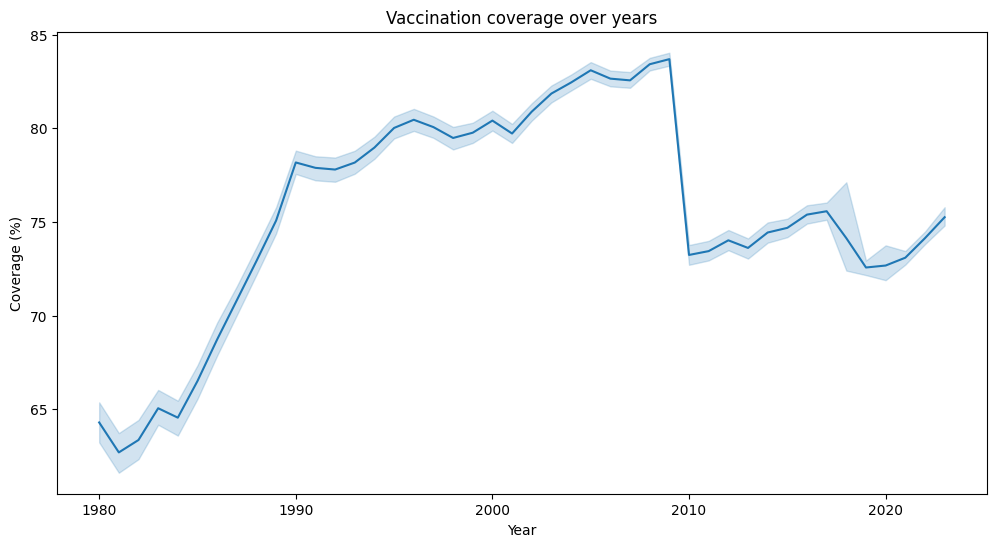

In [134]:
plt.figure(figsize=(12,6))
sns.lineplot(data1, x='YEAR', y= 'COVERAGE')
plt.xlabel('Year')
plt.ylabel('Coverage (%)')
plt.title("Vaccination coverage over years")
plt.show()

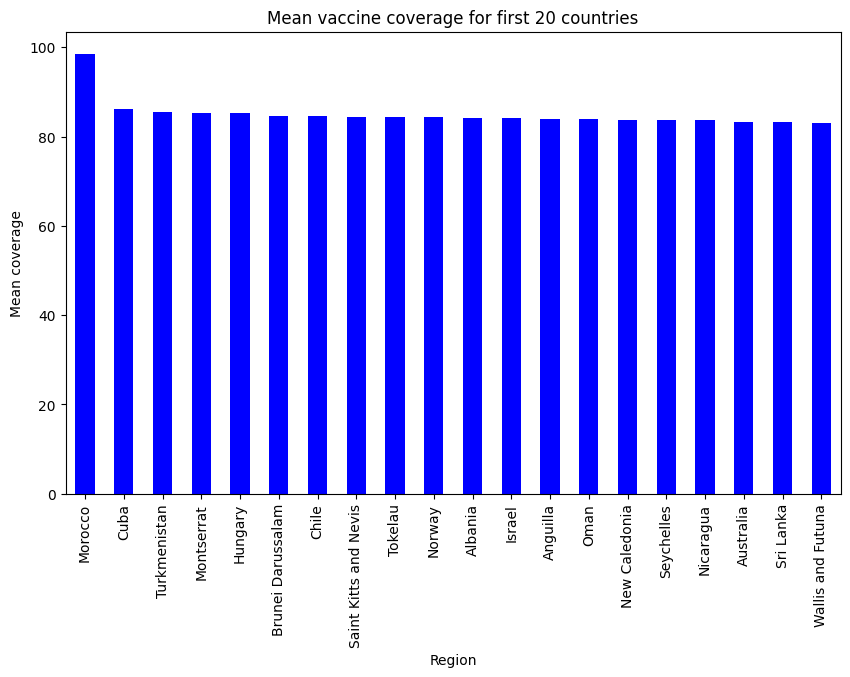

In [135]:
Coverage_region = (
    data1.groupby('NAME')['COVERAGE'].mean().sort_values(ascending=False).head(20)
)
plt.figure(figsize=(10,6))
Coverage_region.plot(kind='bar',color='blue')
plt.xlabel('Region')
plt.ylabel('Mean coverage')
plt.title("Mean vaccine coverage for first 20 countries")
plt.show()

In [136]:
antigen_coverage = data1.groupby('ANTIGEN')['COVERAGE'].mean().sort_values(ascending=False)


In [137]:
antigens= antigen_coverage.head(10)

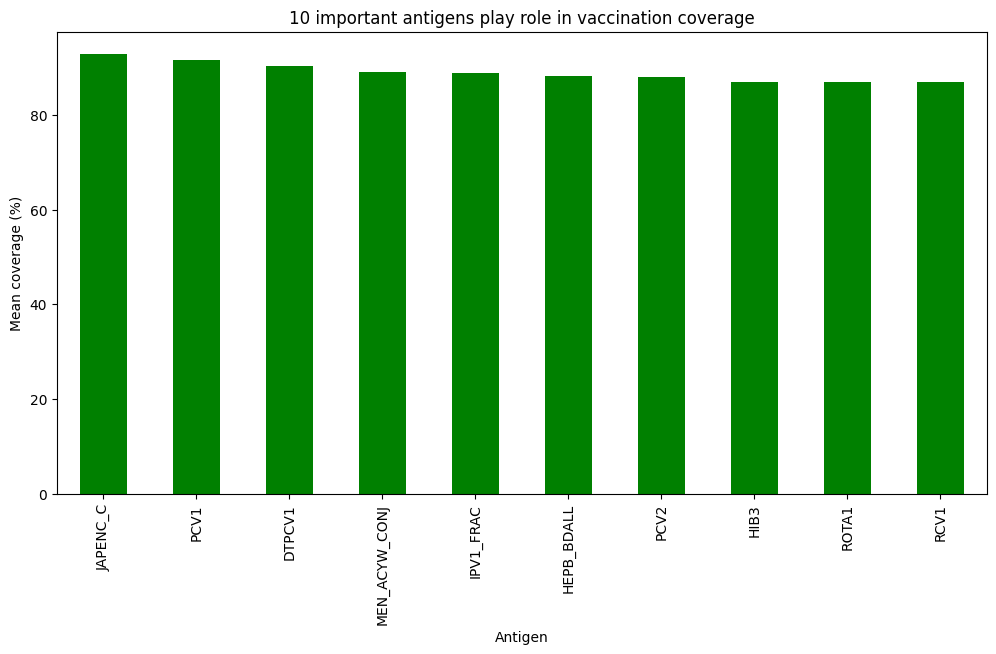

In [138]:
plt.figure(figsize=(12,6))
antigens.plot(color='green', kind='bar')
plt.xlabel("Antigen")
plt.ylabel("Mean coverage (%)")
plt.title("10 important antigens play role in vaccination coverage")
plt.show()

In [139]:
# Coverage Trends Over Years for Top Antigens
top_antigen_lst = antigens.index.tolist()
data = data1[data1['ANTIGEN'].isin(top_antigen_lst)]



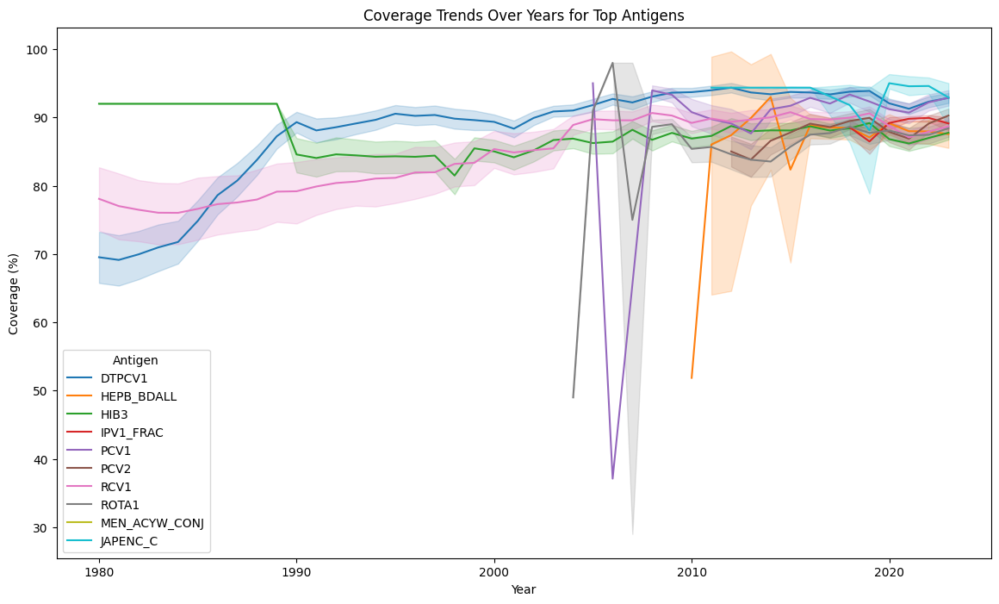

In [140]:
plt.figure(figsize=(14, 8))
sns.lineplot(data= data, x='YEAR', y='COVERAGE', hue='ANTIGEN')
plt.title('Coverage Trends Over Years for Top Antigens')
plt.xlabel('Year')
plt.ylabel('Coverage (%)')
plt.legend(title='Antigen')
plt.show()

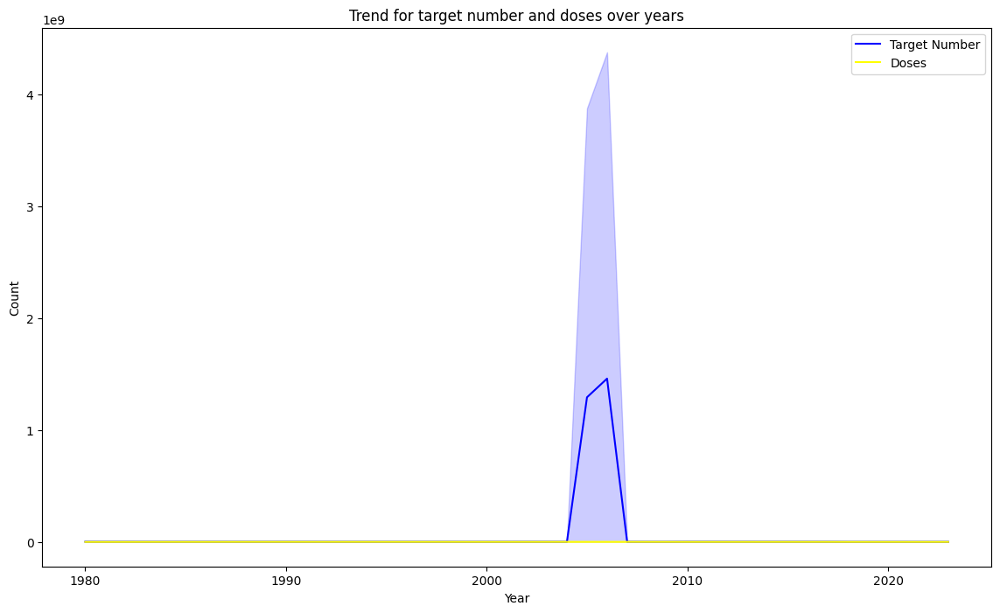

In [141]:
plt.figure(figsize=(14,8))
sns.lineplot(data = data1, x='YEAR', y='TARGET_NUMBER', label='Target Number',color='blue')
sns.lineplot(data =data1, x='YEAR', y ='DOSES', label='Doses', color='yellow')
plt.title("Trend for target number and doses over years")
plt.xlabel("Year")
plt.ylabel("Count")
plt.legend()
plt.show()

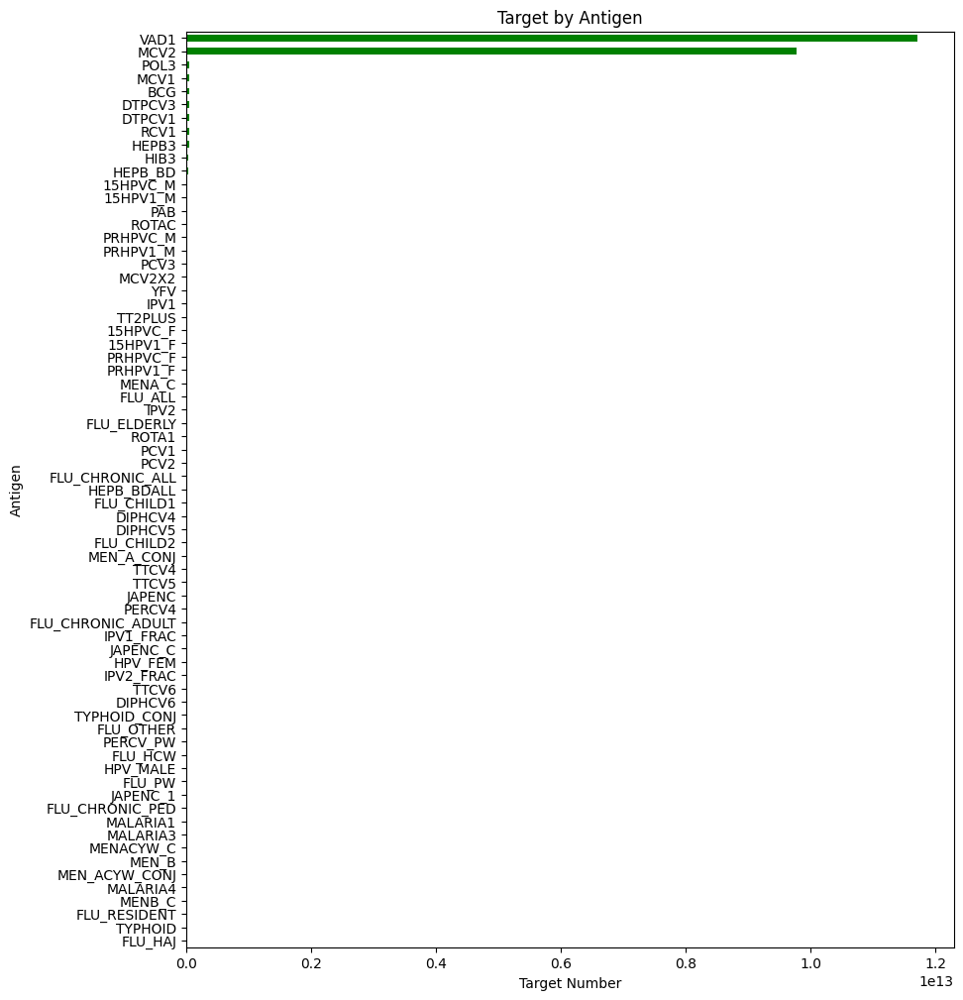

In [142]:
# Calculate total doses by ANTIGEN
target_antigen = data1.groupby('ANTIGEN')['TARGET_NUMBER'].sum().sort_values()

# Plot the total doses by ANTIGEN
plt.figure(figsize=(10, 12))
target_antigen.plot(kind='barh', color='green')
plt.title('Target by Antigen')
plt.xlabel('Target Number')
plt.ylabel('Antigen')
plt.show()


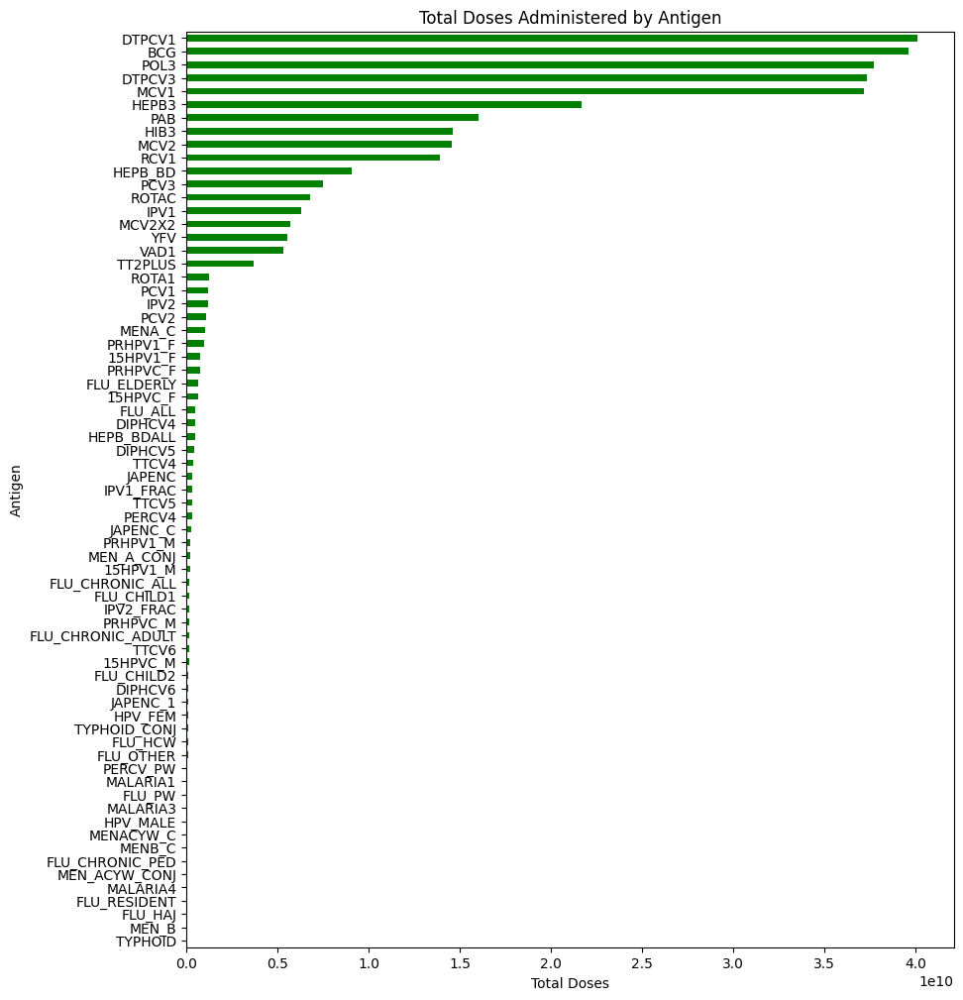

In [143]:
# Calculate total doses by ANTIGEN
total_doses_antigen = data1.groupby('ANTIGEN')['DOSES'].sum().sort_values()

# Plot the total doses by ANTIGEN
plt.figure(figsize=(10, 12))
total_doses_antigen.plot(kind='barh', color='green')
plt.title('Total Doses Administered by Antigen')
plt.xlabel('Total Doses')
plt.ylabel('Antigen')
plt.show()


In [144]:
d2 = pd.read_csv('Disease.csv')

In [145]:
d2

,GROUP,CODE,NAME,YEAR,DISEASE,DISEASE_DESCRIPTION,DENOMINATOR,INCIDENCE_RATE
0,COUNTRIES,ABW,Aruba,2023,CRS,Congenital rubella syndrome,"per 10,000 live births",0.0
1,COUNTRIES,ABW,Aruba,2023,DIPHTHERIA,Diphtheria,"per 1,000,000 total population",0.0
2,COUNTRIES,ABW,Aruba,2023,INVASIVE_MENING,Invasive meningococcal disease,"per 1,000,000 total population",9.3
3,COUNTRIES,ABW,Aruba,2023,MEASLES,Measles,"per 1,000,000 total population",16.5
4,COUNTRIES,ABW,Aruba,2023,MUMPS,Mumps,"per 1,000,000 total population",0.0
...,...,...,...,...,...,...,...,...
84940,COUNTRIES,ZWE,Zimbabwe,1980,NTETANUS,Neonatal tetanus,"per 1,000 live births",0.4
84941,COUNTRIES,ZWE,Zimbabwe,1980,PERTUSSIS,Pertussis,"per 1,000,000 total population",893.3
84942,COUNTRIES,ZWE,Zimbabwe,1980,POLIO,Poliomyelitis,"per 1,000,000 <15 population",0.0
84943,COUNTRIES,ZWE,Zimbabwe,1980,TTETANUS,Total tetanus,"per 1,000,000 total population",19.7


In [147]:
disease_rate = d2.groupby('DISEASE')['INCIDENCE_RATE'].mean().reset_index()

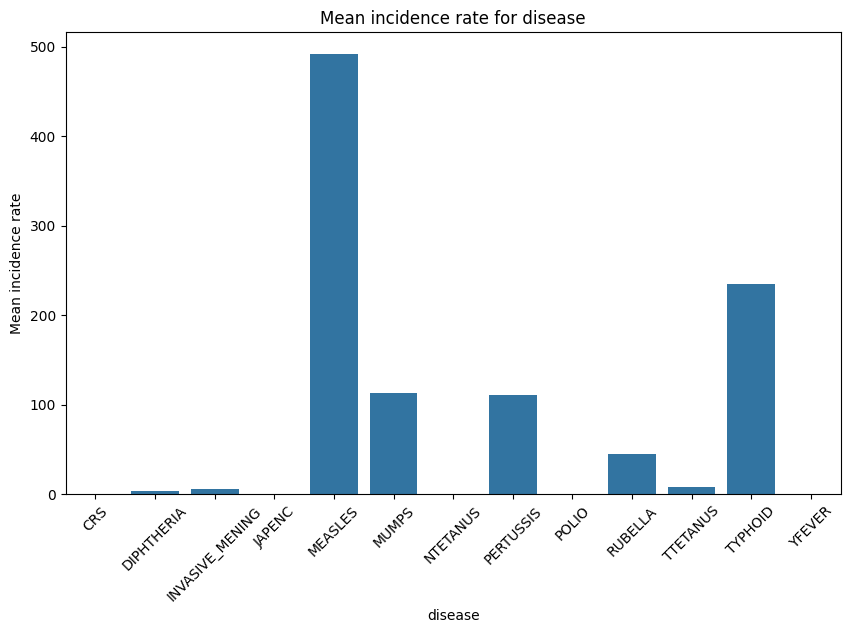

In [149]:
plt.figure(figsize=(10,6))
sns.barplot(data=disease_rate, x='DISEASE', y='INCIDENCE_RATE')
plt.xlabel("disease")
plt.ylabel("Mean incidence rate")
plt.title("Mean incidence rate for disease")
plt.xticks(rotation=45)
plt.show()

In [150]:
time_based_rates = d2.groupby(["DISEASE", "YEAR"])["INCIDENCE_RATE"].mean().reset_index()

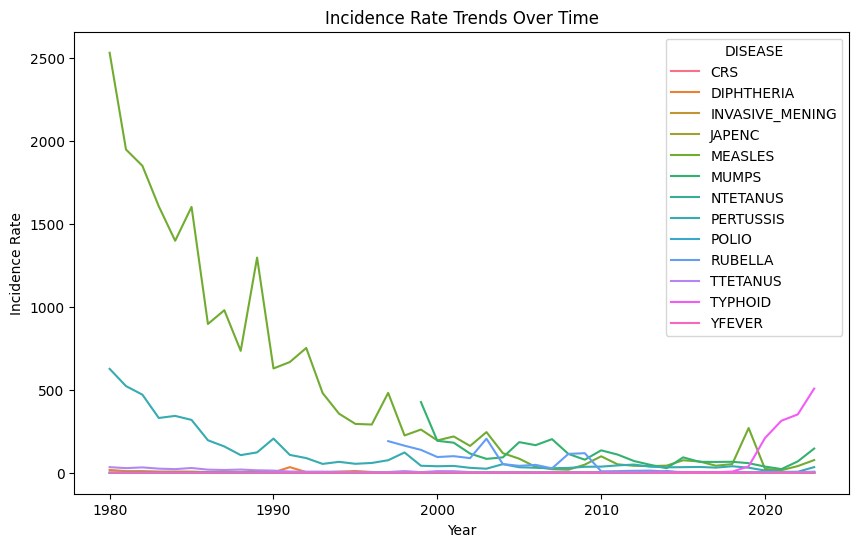

In [151]:
plt.figure(figsize=(10, 6))
sns.lineplot(x="YEAR", y="INCIDENCE_RATE", hue="DISEASE", data=time_based_rates)
plt.xlabel("Year")
plt.ylabel("Incidence Rate")
plt.title("Incidence Rate Trends Over Time")
plt.show()

In [152]:
regional_rates = d2.groupby(["NAME", "DISEASE"])["INCIDENCE_RATE"].mean().reset_index()
top_regions_per_disease = regional_rates.loc[regional_rates.groupby('DISEASE')['INCIDENCE_RATE'].idxmax()]

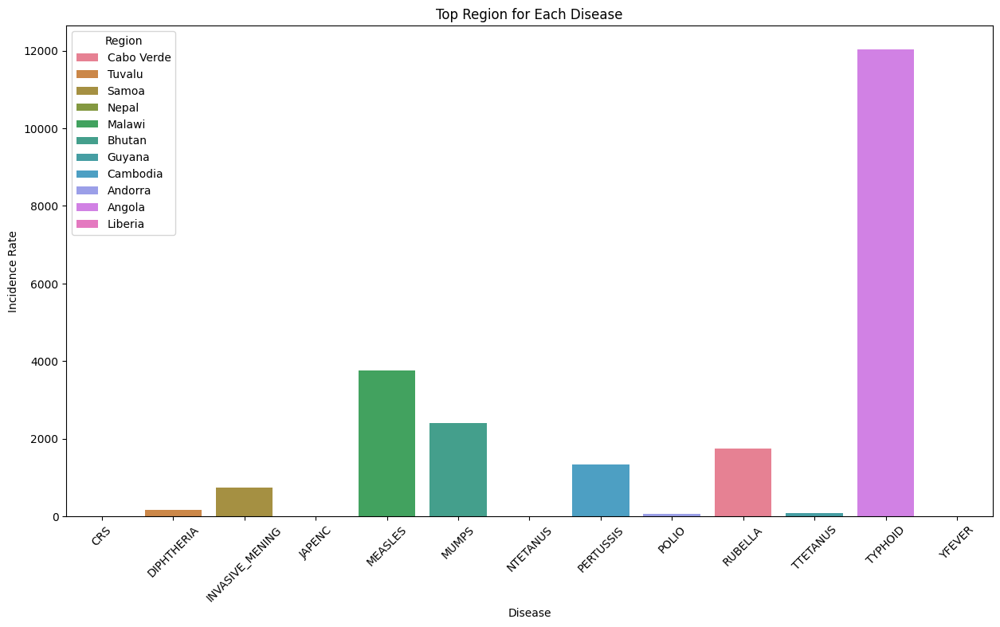

In [153]:
plt.figure(figsize=(15, 8))
sns.barplot(x="DISEASE", y="INCIDENCE_RATE", hue="NAME", data=top_regions_per_disease)
plt.xlabel("Disease")
plt.ylabel("Incidence Rate")
plt.title("Top Region for Each Disease")
plt.xticks(rotation=45)
plt.legend(title="Region")
plt.show()

In [154]:
df3

,GROUP,CODE,NAME,YEAR,DISEASE,DISEASE_DESCRIPTION,CASES
0,COUNTRIES,ABW,Aruba,2023,CRS,Congenital rubella syndrome,0
1,COUNTRIES,ABW,Aruba,2023,DIPHTHERIA,Diphtheria,0
2,COUNTRIES,ABW,Aruba,2023,INVASIVE_MENING,Invasive meningococcal disease,1
3,COUNTRIES,ABW,Aruba,2023,MEASLES,Measles,104
4,COUNTRIES,ABW,Aruba,2023,MUMPS,Mumps,0
...,...,...,...,...,...,...,...
84864,COUNTRIES,ZWE,Zimbabwe,1980,NTETANUS,Neonatal tetanus,134
84865,COUNTRIES,ZWE,Zimbabwe,1980,PERTUSSIS,Pertussis,6290
84866,COUNTRIES,ZWE,Zimbabwe,1980,POLIO,Poliomyelitis,32
84867,COUNTRIES,ZWE,Zimbabwe,1980,TTETANUS,Total tetanus,139


In [155]:
time_based_cases = df3.groupby(['YEAR', 'DISEASE'])['CASES'].sum().reset_index()

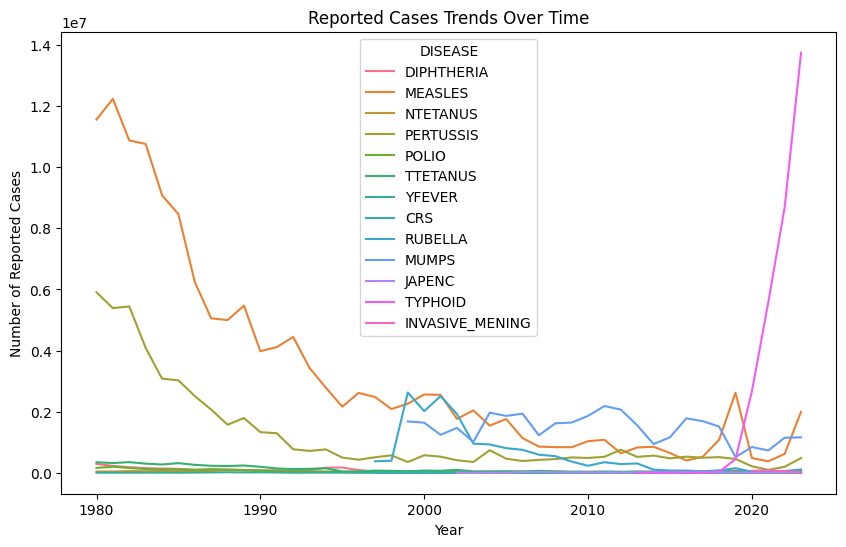

In [156]:
plt.figure(figsize=(10, 6))
sns.lineplot(x="YEAR", y="CASES", hue="DISEASE", data=time_based_cases)
plt.xlabel("Year")
plt.ylabel("Number of Reported Cases")
plt.title("Reported Cases Trends Over Time")
plt.show()

In [158]:
disease_counts = df3.groupby("DISEASE")["CASES"].sum()
disease_counts

DISEASE
CRS                    28650
DIPHTHERIA           2908251
INVASIVE_MENING       207948
JAPENC                225494
MEASLES            144146481
MUMPS               36406001
NTETANUS             1503802
PERTUSSIS           53158249
POLIO                1623271
RUBELLA             16659243
TTETANUS             4894139
TYPHOID             31153514
YFEVER                132678
Name: CASES, dtype: int64

In [163]:
top_regions = df3.groupby('NAME')['CASES'].sum().sort_values(ascending=False).head(10).index
filtered_cases_data = df3[df3['NAME'].isin(top_regions)]

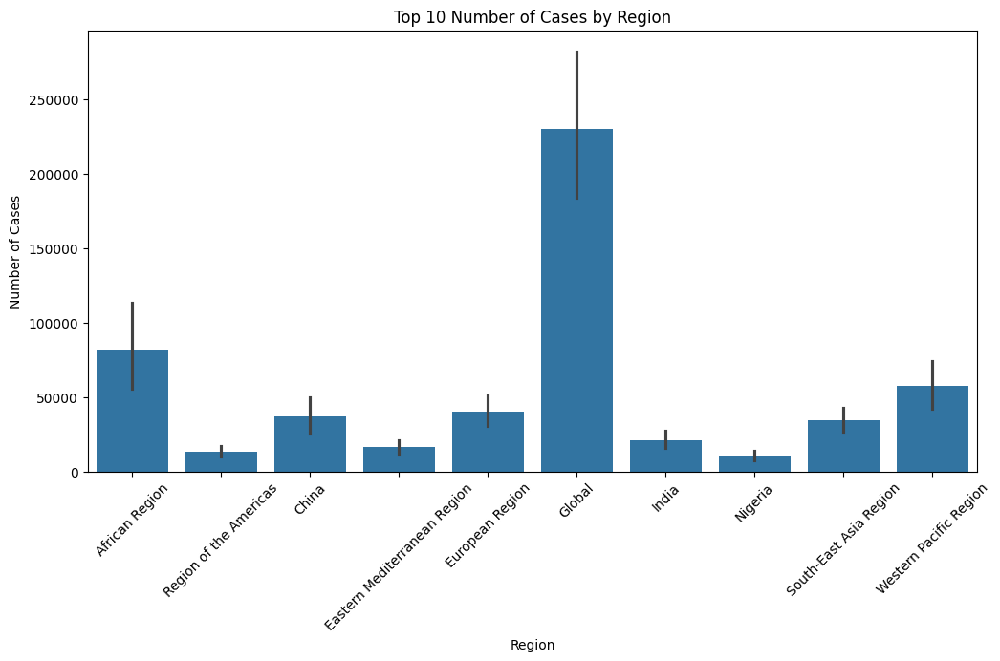

In [167]:
plt.figure(figsize=(12, 6))
sns.barplot(x="NAME", y="CASES", data=filtered_cases_data)
plt.xlabel("Region")
plt.ylabel("Number of Cases")
plt.title("Top 10 Number of Cases by Region")
plt.xticks(rotation=45)
plt.show()

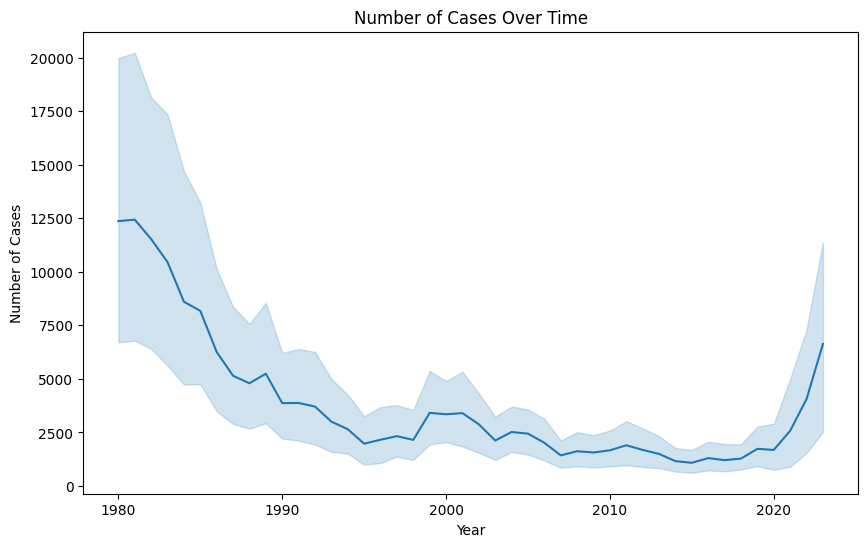

In [168]:
plt.figure(figsize=(10, 6))
sns.lineplot(x="YEAR", y="CASES", data=df3)
plt.xlabel("Year")
plt.ylabel("Number of Cases")
plt.title("Number of Cases Over Time")
plt.show()

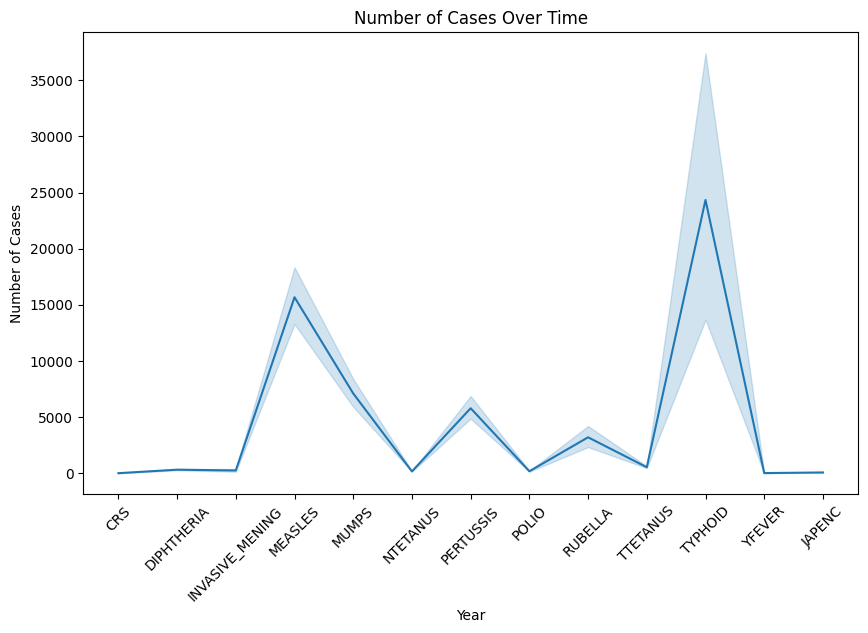

In [169]:
plt.figure(figsize=(10, 6))
sns.lineplot(x="DISEASE", y="CASES", data=df3)
plt.xlabel("Year")
plt.xticks(rotation=45)
plt.ylabel("Number of Cases")
plt.title("Number of Cases Over Time")
plt.show()

In [178]:
pip install plotly

   ---------------------------------------- 0.0/14.8 MB ? eta -:--:--
    --------------------------------------- 0.3/14.8 MB ? eta -:--:--
   -- ------------------------------------- 0.8/14.8 MB 2.4 MB/s eta 0:00:06
   --- ------------------------------------ 1.3/14.8 MB 2.3 MB/s eta 0:00:06
   ---- ----------------------------------- 1.6/14.8 MB 2.2 MB/s eta 0:00:06
   ---- ----------------------------------- 1.8/14.8 MB 2.2 MB/s eta 0:00:06
   ---- ----------------------------------- 1.8/14.8 MB 2.2 MB/s eta 0:00:06
   ---- ----------------------------------- 1.8/14.8 MB 2.2 MB/s eta 0:00:06
   ----- ---------------------------------- 2.1/14.8 MB 1.3 MB/s eta 0:00:10
   ------- -------------------------------- 2.6/14.8 MB 1.4 MB/s eta 0:00:09
   -------- ------------------------------- 3.1/14.8 MB 1.5 MB/s eta 0:00:08
   --------- ------------------------------ 3.7/14.8 MB 1.6 MB/s eta 0:00:07
   ---------- ----------------------------- 3.9/14.8 MB 1.6 MB/s eta 0:00:07
   ----------


[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: C:\Users\dell\First Project\venv\Scripts\python.exe -m pip install --upgrade pip


In [182]:
merged_df = pd.merge(df3, d2, on=['NAME', 'YEAR', 'DISEASE'], how='inner')

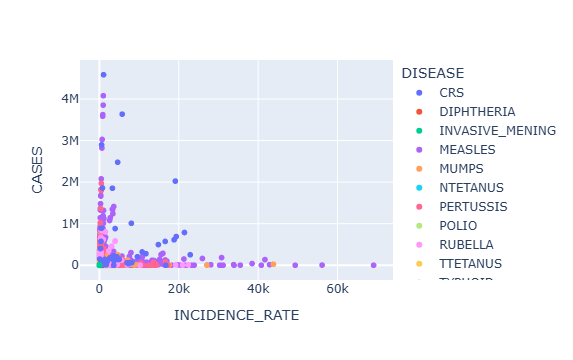

In [183]:
import plotly.express as px
fig = px.scatter(merged_df,x='INCIDENCE_RATE', y='CASES', color='DISEASE')
fig.show()

In [184]:
df4

,ISO_3_CODE,COUNTRYNAME,WHO_REGION,YEAR,DESCRIPTION,INTRO
0,AFG,Afghanistan,EMRO,2023,aP (acellular pertussis) vaccine,No
1,AFG,Afghanistan,EMRO,2023,Hepatitis A vaccine,No
2,AFG,Afghanistan,EMRO,2023,Hepatitis B vaccine,Yes
3,AFG,Afghanistan,EMRO,2023,HepB birth dose,Yes
4,AFG,Afghanistan,EMRO,2023,Hib (Haemophilus influenzae type B) vaccine,Yes
...,...,...,...,...,...,...
138315,ZWE,Zimbabwe,AFRO,1944,Seasonal Influenza vaccine,No
138316,ZWE,Zimbabwe,AFRO,1943,Seasonal Influenza vaccine,No
138317,ZWE,Zimbabwe,AFRO,1942,Seasonal Influenza vaccine,No
138318,ZWE,Zimbabwe,AFRO,1941,Seasonal Influenza vaccine,No


In [185]:
intro = df4['INTRO'].value_counts()


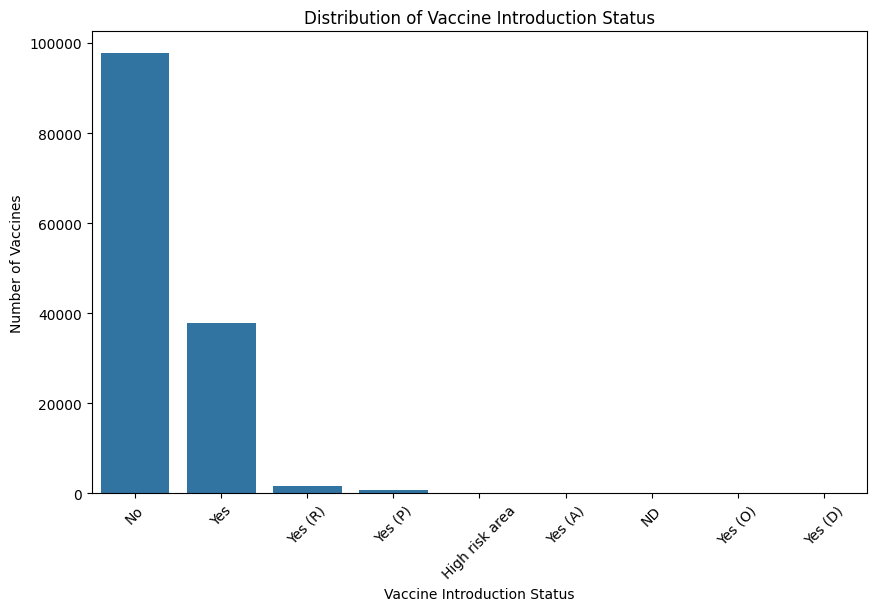

In [187]:
plt.figure(figsize=(10, 6))
sns.barplot(x=intro.index, y=intro.values)
plt.xlabel("Vaccine Introduction Status")
plt.ylabel("Number of Vaccines")
plt.title("Distribution of Vaccine Introduction Status")
plt.xticks(rotation=45)
plt.show()

In [188]:
intro_status= ['Yes', 'Yes (P)', 'Yes (R)', 'Yes (A)', 'Yes (O)', 'Yes (S)', 'Yes (OPV)', 'High risk','No', 'No (D)', 'ND', 'NR']

In [189]:
introduced_vaccines = df4[df4['INTRO'].isin(intro_status)]

In [190]:
yearly_intro_counts = introduced_vaccines.groupby(['YEAR', 'INTRO']).size().reset_index(name='Count')

In [191]:
yearly_intro_pivot = yearly_intro_counts.pivot(index='YEAR', columns='INTRO', values='Count').fillna(0)

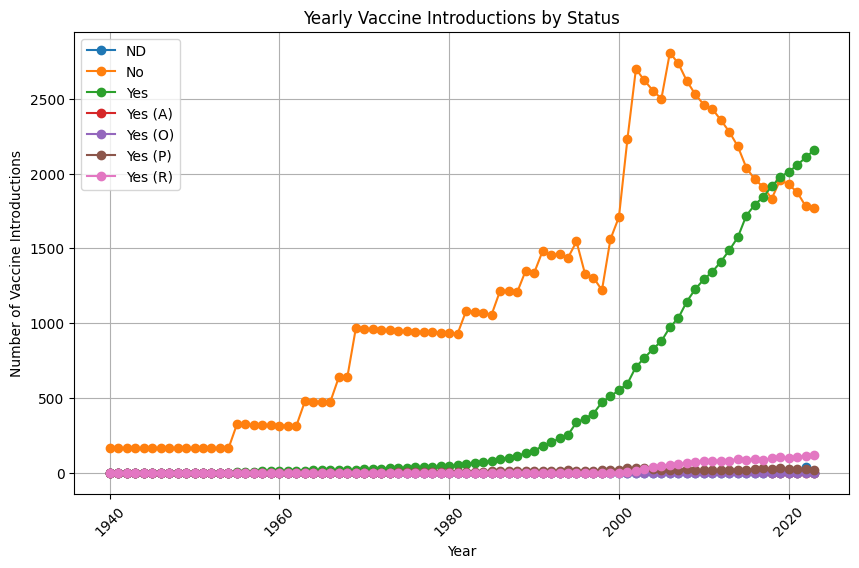

In [192]:
plt.figure(figsize=(10, 6))
for col in yearly_intro_pivot.columns:
    plt.plot(yearly_intro_pivot.index, yearly_intro_pivot[col], label=col, marker='o')

plt.xlabel("Year")
plt.ylabel("Number of Vaccine Introductions")
plt.title("Yearly Vaccine Introductions by Status")
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

In [193]:
df5

,ISO_3_CODE,COUNTRYNAME,WHO_REGION,YEAR,VACCINECODE,VACCINE_DESCRIPTION,SCHEDULEROUNDS,TARGETPOP,TARGETPOP_DESCRIPTION,GEOAREA,AGEADMINISTERED,SOURCECOMMENT
0,ABW,Aruba,AMRO,2023,DTAPHIBIPV,DTaP-Hib-IPV (acellular) vaccine,1,RISKGROUPS,General/routine,NATIONAL,M2,NA
1,ABW,Aruba,AMRO,2023,DTAPHIBIPV,DTaP-Hib-IPV (acellular) vaccine,2,RISKGROUPS,General/routine,NATIONAL,M4,NA
2,ABW,Aruba,AMRO,2023,DTAPHIBIPV,DTaP-Hib-IPV (acellular) vaccine,3,RISKGROUPS,General/routine,NATIONAL,M6,NA
3,ABW,Aruba,AMRO,2023,DTAPHIBIPV,DTaP-Hib-IPV (acellular) vaccine,4,B_2YL_W,General/routine,NATIONAL,M15,NA
4,ABW,Aruba,AMRO,2023,DTAPIPV,DTaP-IPV (acellular) vaccine,5,B_CHILD_W,General/routine,NATIONAL,Y4,NA
...,...,...,...,...,...,...,...,...,...,...,...,...
8047,ZWE,Zimbabwe,AFRO,2023,VITAMINA,Vitamin A supplements,2,RISKGROUPS,General/routine,NATIONAL,M12,M6-M59
8048,ZWE,Zimbabwe,AFRO,2023,VITAMINA,Vitamin A supplements,3,RISKGROUPS,General/routine,NATIONAL,M18,M6-M59
8049,ZWE,Zimbabwe,AFRO,2023,VITAMINA,Vitamin A supplements,4,RISKGROUPS,General/routine,NATIONAL,M24,M6-M59
8050,ZWE,Zimbabwe,AFRO,2023,VITAMINA,Vitamin A supplements,5,RISKGROUPS,General/routine,NATIONAL,M30,M6-M59


In [194]:
N = 10
top_vaccine_codes = df5['VACCINECODE'].value_counts().nlargest(N).index
filtered_df = df5[df5['VACCINECODE'].isin(top_vaccine_codes)]

In [195]:
vaccine_schedulerounds_sum = filtered_df.groupby('VACCINECODE')['SCHEDULEROUNDS'].sum().reset_index()

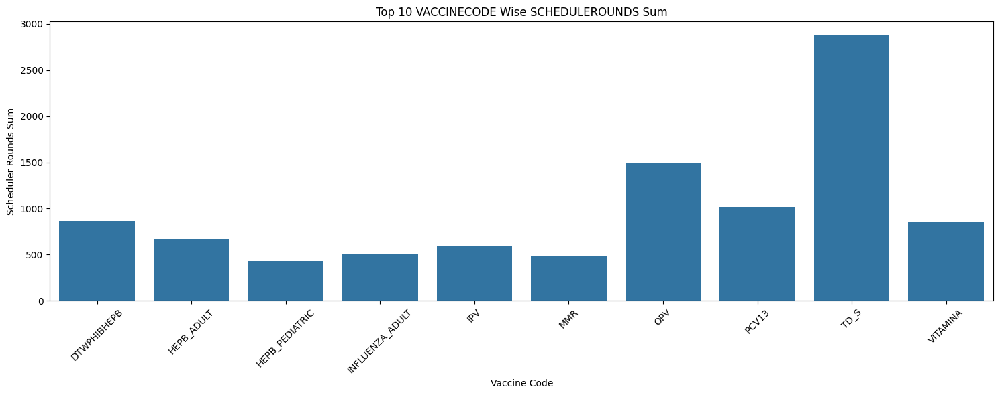

In [196]:
plt.figure(figsize=(15, 6))
sns.barplot(x='VACCINECODE', y='SCHEDULEROUNDS', data=vaccine_schedulerounds_sum)
plt.title(f'Top {N} VACCINECODE Wise SCHEDULEROUNDS Sum')
plt.xlabel('Vaccine Code')
plt.ylabel('Scheduler Rounds Sum')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [197]:
geoarea_vaccine_counts = filtered_df.groupby(['GEOAREA', 'VACCINECODE']).size().reset_index(name='counts')

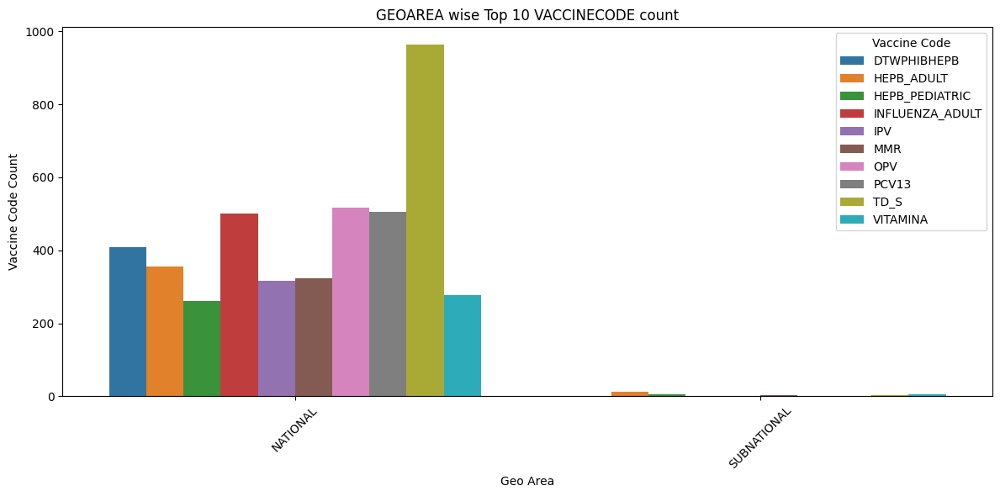

In [198]:
plt.figure(figsize=(12, 6))
sns.barplot(x='GEOAREA', y='counts', hue='VACCINECODE', data=geoarea_vaccine_counts)
plt.title(f'GEOAREA wise Top {N} VACCINECODE count')
plt.xlabel('Geo Area')
plt.ylabel('Vaccine Code Count')
plt.legend(title='Vaccine Code')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [199]:
# the number count of vaccines recommended for each age group
age_group_counts = df5.groupby(['COUNTRYNAME', 'YEAR', 'AGEADMINISTERED']).size().reset_index(name='VACCINE_COUNT')
age_group_counts

,COUNTRYNAME,YEAR,AGEADMINISTERED,VACCINE_COUNT
0,Afghanistan,2023,+M1,1
1,Afghanistan,2023,+M6,1
2,Afghanistan,2023,+Y1,2
3,Afghanistan,2023,1st contact,1
4,Afghanistan,2023,B,3
...,...,...,...,...
3480,"occupied Palestinian territory, including east...",2023,M4,4
3481,"occupied Palestinian territory, including east...",2023,M6,3
3482,"occupied Palestinian territory, including east...",2023,W1,1
3483,"occupied Palestinian territory, including east...",2023,Y15,1


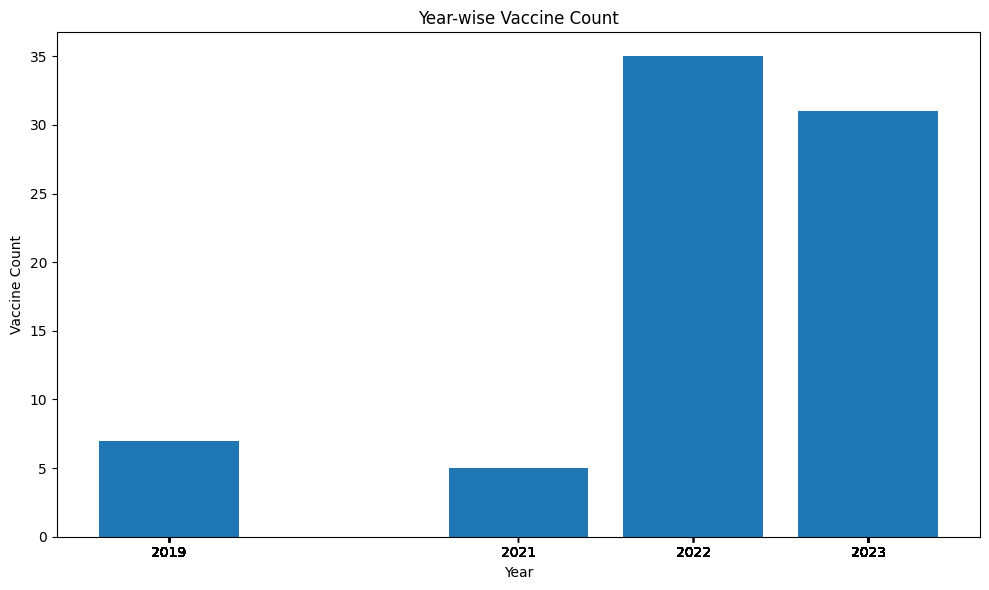

In [200]:
plt.figure(figsize=(10, 6))
plt.bar(age_group_counts['YEAR'], age_group_counts['VACCINE_COUNT'])
plt.title('Year-wise Vaccine Count')
plt.xlabel('Year')
plt.ylabel('Vaccine Count')
plt.xticks(age_group_counts['YEAR'])
plt.tight_layout()
plt.show()

In [201]:
# Calculating total number of vaccines recommended per year and country
vaccines_per_year_country = age_group_counts.groupby(['COUNTRYNAME', 'YEAR'])['VACCINE_COUNT'].sum().reset_index(name='TOTAL_VACCINES')
vaccines_per_year_country

,COUNTRYNAME,YEAR,TOTAL_VACCINES
0,Afghanistan,2023,24
1,Albania,2023,30
2,Algeria,2023,21
3,Andorra,2023,31
4,Angola,2023,27
...,...,...,...
208,Wallis and Futuna,2019,12
209,Yemen,2023,40
210,Zambia,2023,37
211,Zimbabwe,2023,38


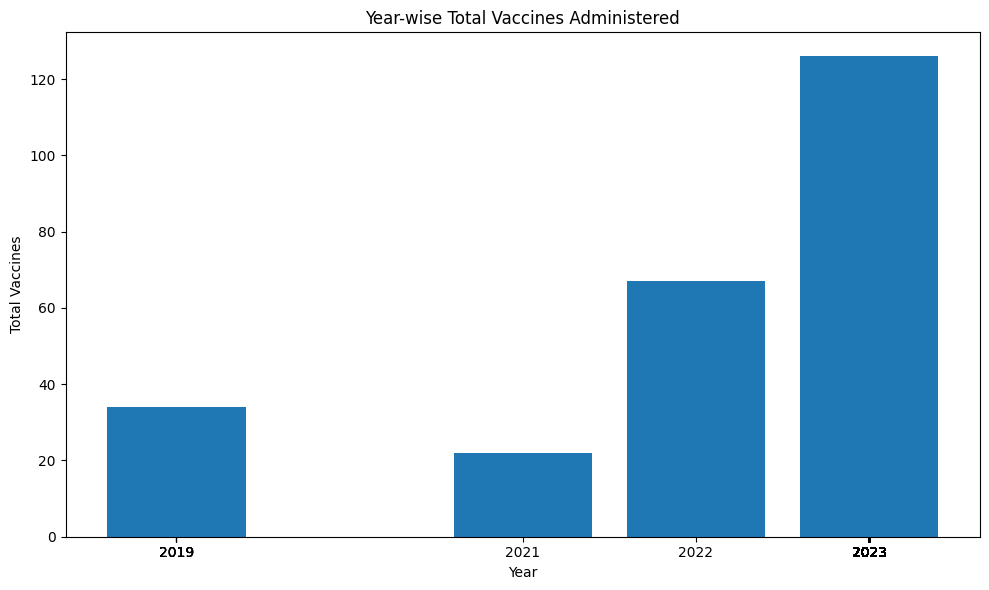

In [203]:
plt.figure(figsize=(10, 6))
plt.bar(vaccines_per_year_country['YEAR'], vaccines_per_year_country['TOTAL_VACCINES'])
plt.title('Year-wise Total Vaccines Administered')
plt.xlabel('Year')
plt.ylabel('Total Vaccines')
plt.xticks(vaccines_per_year_country['YEAR'])
plt.tight_layout()
plt.show()

In [204]:
# Calculating the number of vaccines per target population
targetpop_vaccine = df5.groupby('VACCINECODE')['TARGETPOP'].nunique()
targetpop_vaccine

VACCINECODE
ANTHRAX       1
AP            2
BCG           3
CCHF          1
CHOLERA       2
             ..
TYPHOID_PS    2
VARICELLA     5
VITAMINA      2
YF            2
ZOSTER        3
Name: TARGETPOP, Length: 86, dtype: int64

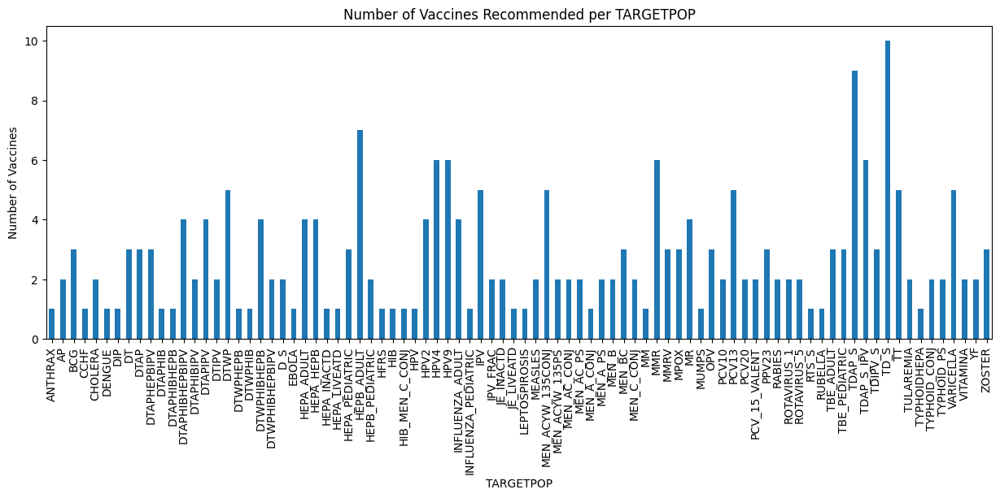

In [205]:
plt.figure(figsize=(15, 5))
targetpop_vaccine.plot(kind='bar')
plt.xlabel('TARGETPOP')
plt.ylabel('Number of Vaccines')
plt.title('Number of Vaccines Recommended per TARGETPOP')
plt.show()

In [206]:
import pandas as pd

df = pd.read_csv(r"C:\Users\dell\Coverage.csv")

print(df["TARGET_NUMBER"].describe())  # Check min/max values
print(df["TARGET_NUMBER"].dtype)  # Check data type
print(df["TARGET_NUMBER"].unique()[:10])  # Print first 10 unique values


count    3.998580e+05
mean     5.538699e+07
std      2.407485e+10
min      0.000000e+00
25%      1.950530e+05
50%      3.511920e+05
75%      4.612320e+05
max      1.170000e+13
Name: TARGET_NUMBER, dtype: float64
int64
[429586   1044  65501   1219  61614   1468  39602    945 359521 346530]


In [207]:
import pandas as pd

df = pd.read_csv(r"C:\Users\dell\Vaccination_schedule.csv")

print(df.isnull().sum())  # Count missing values in each column
print(df.head())  # Display first few rows


ISO_3_CODE                  0
COUNTRYNAME                 0
WHO_REGION                  0
YEAR                        0
VACCINECODE                 0
VACCINE_DESCRIPTION         0
SCHEDULEROUNDS              0
TARGETPOP                   0
TARGETPOP_DESCRIPTION       0
GEOAREA                     0
AGEADMINISTERED             0
SOURCECOMMENT            2913
dtype: int64
  ISO_3_CODE COUNTRYNAME WHO_REGION  YEAR VACCINECODE  \
0        ABW       Aruba       AMRO  2023  DTAPHIBIPV   
1        ABW       Aruba       AMRO  2023  DTAPHIBIPV   
2        ABW       Aruba       AMRO  2023  DTAPHIBIPV   
3        ABW       Aruba       AMRO  2023  DTAPHIBIPV   
4        ABW       Aruba       AMRO  2023     DTAPIPV   

                VACCINE_DESCRIPTION  SCHEDULEROUNDS   TARGETPOP  \
0  DTaP-Hib-IPV (acellular) vaccine               1  RISKGROUPS   
1  DTaP-Hib-IPV (acellular) vaccine               2  RISKGROUPS   
2  DTaP-Hib-IPV (acellular) vaccine               3  RISKGROUPS   
3  DTaP-Hib-IPV 

In [209]:
df.update(df['SOURCECOMMENT'].fillna('No comment available'))

In [210]:
df['SOURCECOMMENT'].isnull().sum()

np.int64(0)